In [1]:
from IPython.core.display import HTML
HTML("<style>.container { width:90% !important; }</style>")

In [4]:
import os
import numpy as np
import lsst.afw.display.ds9 as ds9
import lsst.afw.image as afwImage

import matplotlib.pyplot as plt
%matplotlib inline
import pyfits as pf

import functions as fn
fn = reload(fn)

def GetName(variable):
    ret = []
    for k, v in list(globals().iteritems()):
         if v is variable:
            ret.append(str(k))
    return str(ret)

In [20]:
data_path = '/nfs/lsst2/photocalData/data/observer2/'
# NB_568 = [496511,496512,496513,496514]
NB_568    = [496512,496513,496514]
NB_671_1  = [496520,496521,496522]
NB_671_2  = [496524,496525,496526,496527,496528,496529]
NB_680    = [496533,496534,496535]
NB_700    = [496540,496541,496542]
BB = [496508, 496509, 496510]

NB_568_visits   = [data_path + 'DECam_00' + str(_) + '.fits.fz' for _ in NB_568]
NB_671_visits_1 = [data_path + 'DECam_00' + str(_) + '.fits.fz' for _ in NB_671_1]
NB_671_visits_2 = [data_path + 'DECam_00' + str(_) + '.fits.fz' for _ in NB_671_2]
NB_680_visits   = [data_path + 'DECam_00' + str(_) + '.fits.fz' for _ in NB_680]
NB_700_visits   = [data_path + 'DECam_00' + str(_) + '.fits.fz' for _ in NB_700]
BB_visits = [data_path + 'DECam_00' + str(_) + '.fits.fz' for _ in BB]

HDU_NUM = 28
DEBUG = True
FIXED_THR = True

Subtracting overscan of 2328.45
Removing hottest 3 pixels from
[616], [367]
[616], [368]
[617], [367]
Found local backgrounds of 2534.6, 2553.1, 2542.3, 2561.4
Subtracted their average = 2547.9
Clipped mean, stddev of postage stamp = 3.67, 24
Low threshold      = 125.00	 ADU
Flux               = 50.06	 mega-ADU
Brightness         = 250.29	 kADU/s
Avg pix brightness = 4.50	 ADU/pix/s
(n pix used        = 55624)

High threshold     = 600.00	 ADU
Flux               = 39.17	 mega-ADU
Brightness         = 195.83	 kADU/s
Avg pix brightness = 9.90	 ADU/pix/s
(n pix used        = 19779)
Percentile thr = 8460.69778906
n percentile pix = 245

Ultra-high threshold = 8460.70	 ADU
Flux                 = 2.19	 mega-ADU
--------------------------------------- Brightness is meaningless here now but "=" 10.94 kADU/s
Avg pix brightness   = 44.65	 ADU/pix/s
(n pix used          = 245)
Avg pix brightness PSF  = 1021.60	 ADU/pix/s
Subtracting overscan of 2328.25
Removing hottest 3 pixels from
[616], [367]


/home/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:82: RuntimeWarning: Degrees of freedom <= 0 for slice
  warnings.warn("Degrees of freedom <= 0 for slice", RuntimeWarning)
/home/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:94: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:116: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/home/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
/home/lsstsw/miniconda/lib/python2.7/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


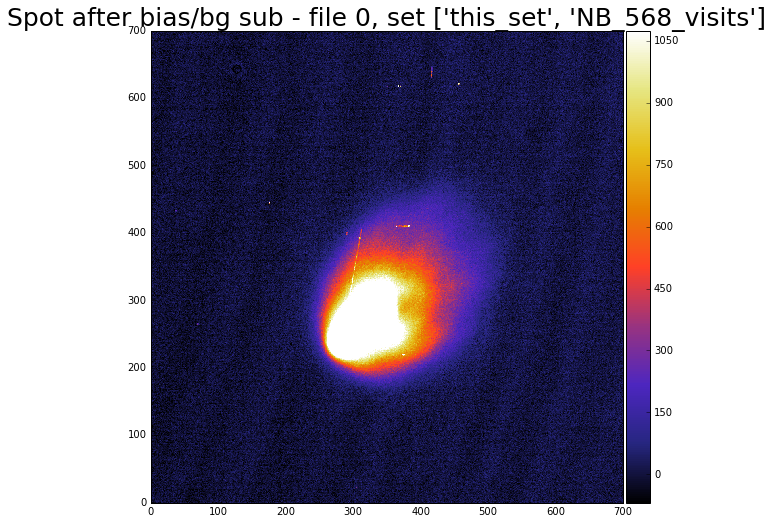

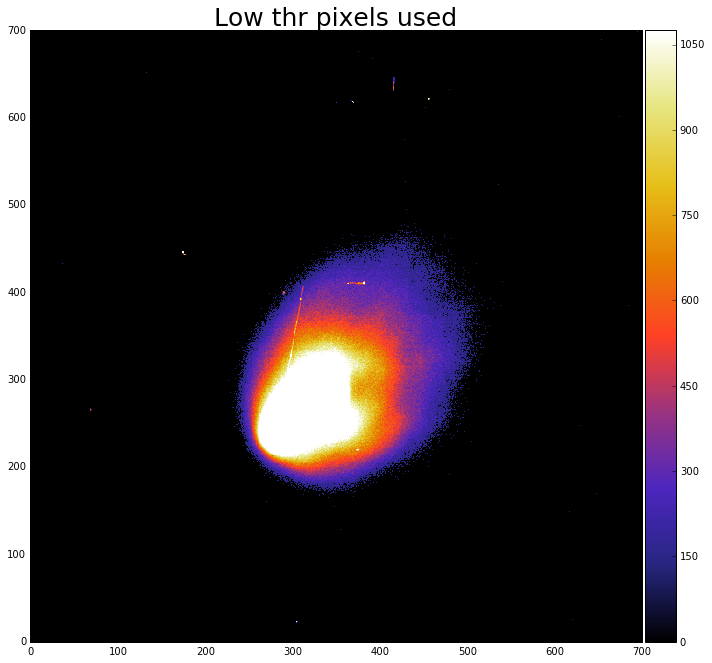

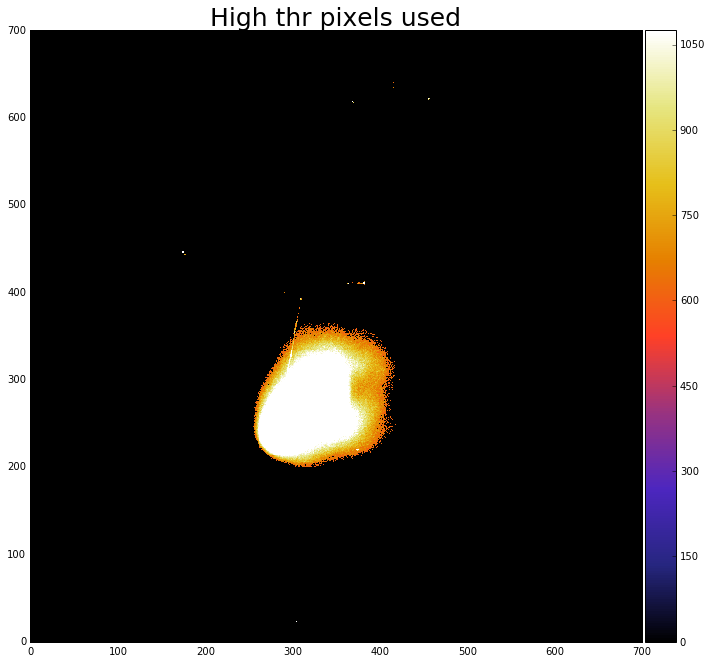

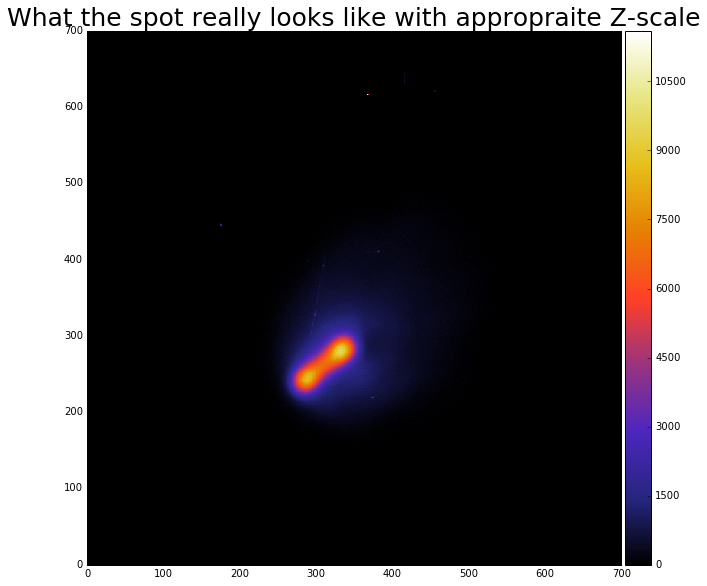

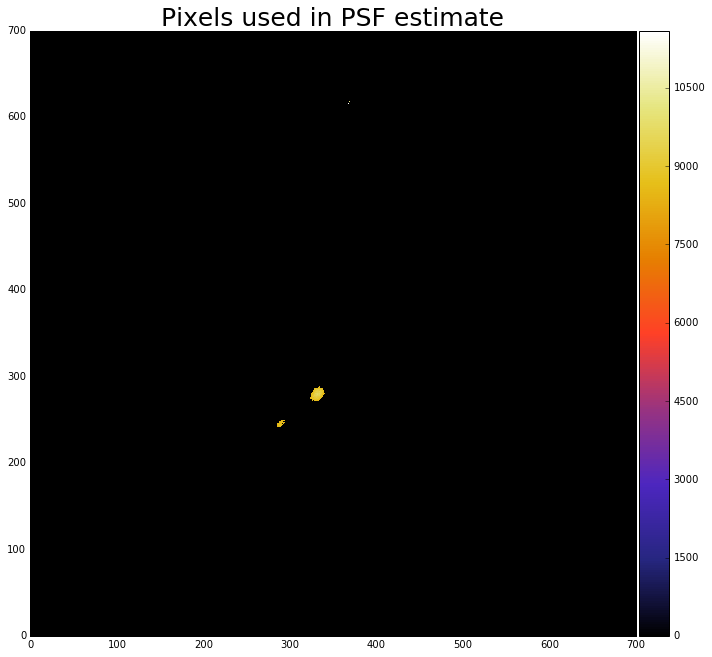

...

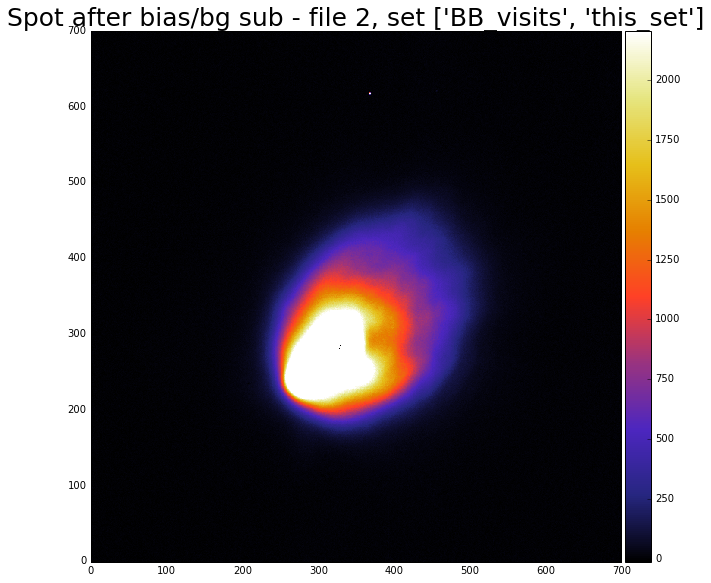

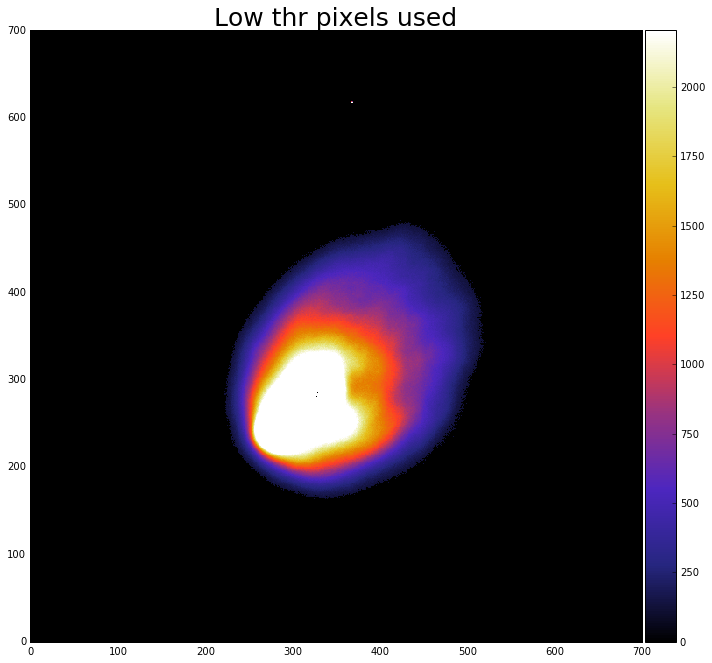

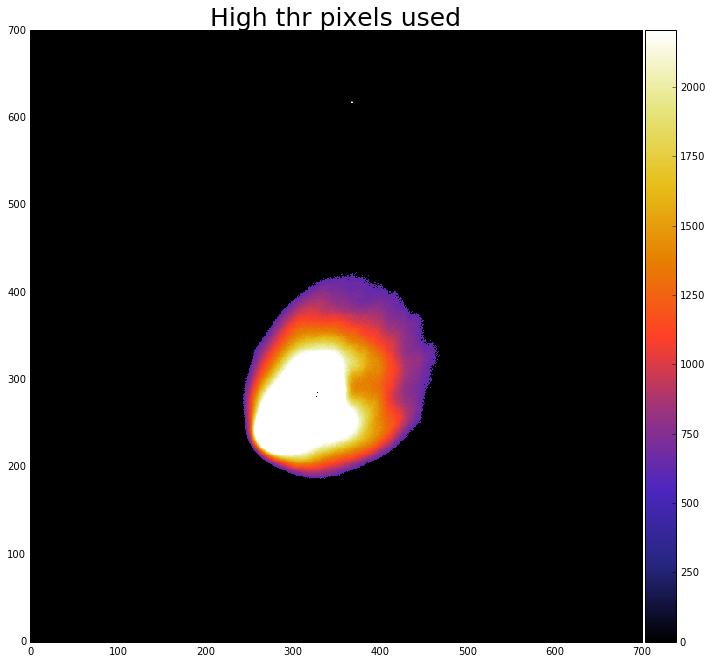

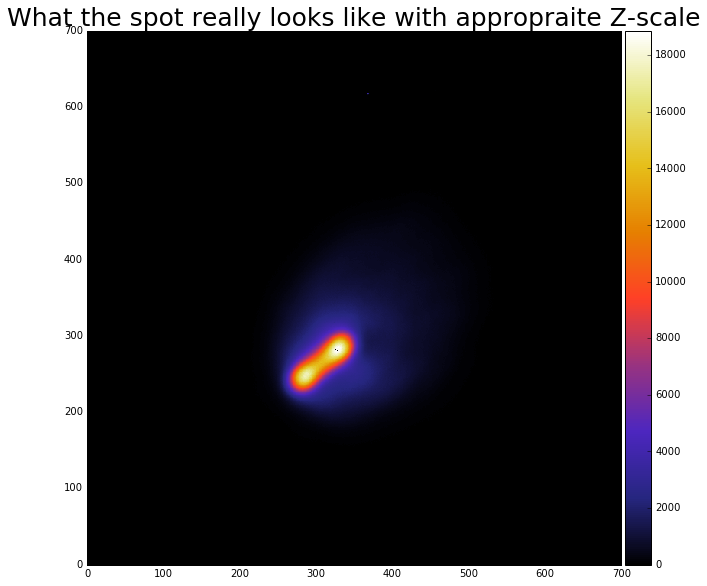

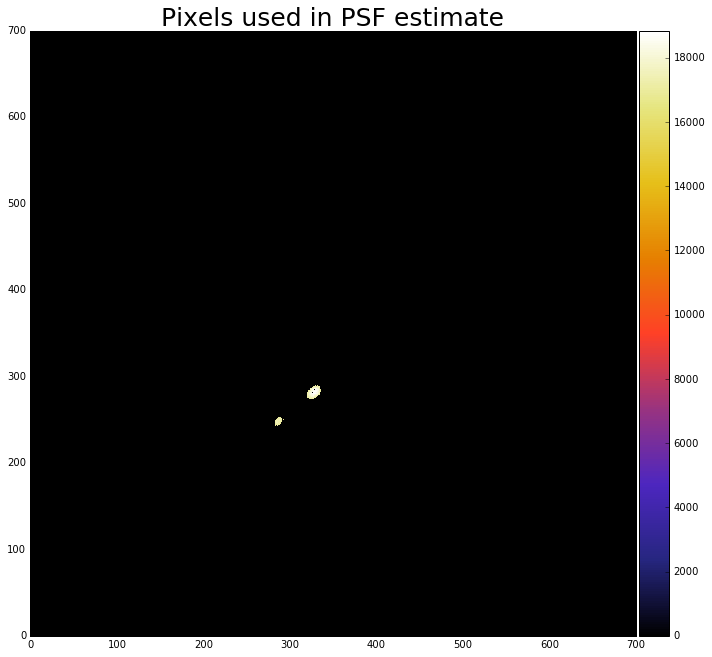

In [21]:
datasets = [NB_568_visits, NB_671_visits_1, NB_671_visits_2, NB_680_visits, NB_700_visits, BB_visits]
# datasets = [NB_680_visits]

for this_set in datasets:
    expnums = []

    low_thresholds = []
    low_fluxes = []
    low_brightnesses = []
    low_av_pix_brights = []
    low_npix = []

    high_thresholds = []
    high_fluxes = []
    high_brightnesses = []
    high_av_pix_brights = []
    high_npix = []

    superhigh_thresholds = []
    superhigh_fluxes = []
    superhigh_brightnesses = []
    superhigh_av_pix_brights = []
    superhigh_npix = []
    PSF_brightnesses = []

    for filenum, filename in enumerate(this_set):
        d_file = pf.open(filename)
        primaryHeader = d_file[0].header
        exptime = primaryHeader['EXPTIME']
        expnums.append(exptime)
        data = d_file[HDU_NUM].data
        d_file.close()

        data = data.astype(np.float32) #convert data type
        overscan_region = data[2073 + 100:4146-50,2160-40:2160-10]
        overscan = np.mean(overscan_region)
        if DEBUG: print 'Subtracting overscan of', overscan
        data -= float(overscan)

        # approximate definition of upper half of one amplifier, just for ease of viewing/cropping
        row_first = 4146/2
        row_last = 4146
        col_first = 2160/2
        col_last = 2160
        roi = data[row_first:row_last,col_first:col_last]
        spot = roi[200:900,200:900]

        n_bad_pix = 3
        if DEBUG: print 'Removing hottest %s pixels from'%n_bad_pix
        for i in range(n_bad_pix): #remove the n hottest pixels
            bad_x, bad_y = np.where(spot == np.max(spot))
            if DEBUG: print '%s, %s'%(bad_x, bad_y)
            spot[bad_x,bad_y] =0

        local_background_1, clipped_sigma_1 = fn.getClippedMeanandStddev(spot[0:100,0:100])
        local_background_2, clipped_sigma_2 = fn.getClippedMeanandStddev(spot[0:100,600:700])
        local_background_3, clipped_sigma_3 = fn.getClippedMeanandStddev(spot[600:700,0:100])
        local_background_4, clipped_sigma_4 = fn.getClippedMeanandStddev(spot[600:700,600:700])
        mean_background = np.mean([local_background_1,local_background_2,local_background_3,local_background_4])
        spot -= mean_background
        if DEBUG: print 'Found local backgrounds of %.1f, %.1f, %.1f, %.1f' %(local_background_1,local_background_2,local_background_3,local_background_4)
        if DEBUG: print 'Subtracted their average = %.1f'%mean_background


        spot_clipped_mean, spot_std_dev = fn.getClippedMeanandStddev(spot, nsig=2)
        if DEBUG: print 'Clipped mean, stddev of postage stamp = %.2f, %2.f'%(spot_clipped_mean, spot_std_dev)

        title = 'Spot after bias/bg sub - file %s, set %s'%(filenum, GetName(this_set))
        fn.ShowSpot(spot, half_stretch='auto', useClippedMean=True, n_sig_clip=2, title=title)

        ##############################################

        n_sig_above_background = 5
        thr = spot_clipped_mean + (n_sig_above_background * spot_std_dev)
        if FIXED_THR: thr = 125
        spot_thresholded = spot.copy()
        thr_pix = np.where(spot_thresholded>thr) # for calculating flux per pixel
        n_pix_above_thr = len(thr_pix[0]) # for calculating flux per pixel
        spot_thresholded[spot_thresholded<=thr] = 0 #for the image
        if DEBUG: fn.ShowSpot(spot_thresholded, half_stretch='auto', useClippedMean=True, n_sig_clip=2, title='Low thr pixels used')

        flux = spot_thresholded.sum()
        if DEBUG: print 'Low threshold      = %.2f\t ADU'%thr
        if DEBUG: print 'Flux               = %.2f\t mega-ADU' %(flux/1000000.)
        if DEBUG: print 'Brightness         = %.2f\t kADU/s'%(flux/float(exptime*1000))
        if DEBUG: print 'Avg pix brightness = %.2f\t ADU/pix/s'%(flux/float(exptime*n_pix_above_thr))
        if DEBUG: print '(n pix used        = %s)'%n_pix_above_thr
        low_thresholds.append(thr)
        low_fluxes.append(flux/1000000.)
        low_brightnesses.append(flux/float(exptime*1000))
        low_av_pix_brights.append(flux/float(exptime*n_pix_above_thr))
        low_npix.append(flux/float(exptime*n_pix_above_thr))


        total_flux_save = flux

        n_sig_above_background = 25
        thr = spot_clipped_mean + (n_sig_above_background * spot_std_dev)
        if FIXED_THR: thr = 600
        spot_thresholded = spot.copy()
        thr_pix = np.where(spot_thresholded>thr) # for calculating flux per pixel
        n_pix_above_thr = len(thr_pix[0]) # for calculating flux per pixel
        spot_thresholded[spot_thresholded<=thr] = 0 #for the image
        if DEBUG: fn.ShowSpot(spot_thresholded, half_stretch='auto', useClippedMean=True, n_sig_clip=2, title='High thr pixels used')

        flux = spot_thresholded.sum()
        if DEBUG: print 
        if DEBUG: print 'High threshold     = %.2f\t ADU'%thr
        if DEBUG: print 'Flux               = %.2f\t mega-ADU' %(flux/1000000.)
        if DEBUG: print 'Brightness         = %.2f\t kADU/s'%(flux/float(exptime*1000))
        if DEBUG: print 'Avg pix brightness = %.2f\t ADU/pix/s'%(flux/float(exptime*n_pix_above_thr))
        if DEBUG: print '(n pix used        = %s)'%n_pix_above_thr
        high_thresholds.append(thr)
        high_fluxes.append(flux/1000000.)
        high_brightnesses.append(flux/float(exptime*1000))
        high_av_pix_brights.append(flux/float(exptime*n_pix_above_thr))
        high_npix.append(flux/float(exptime*n_pix_above_thr))

        ####################
        # add these to show shape of bright spot, and estimate what things might have been like if we'd been difraction limited, or at least had a decent PSF:

        spot_thresholded = spot.copy()
        spot_thresholded[spot_thresholded<=0] = 0 #for the image
        if DEBUG: fn.ShowSpot(spot_thresholded, half_stretch=-1, useClippedMean=True, n_sig_clip=2, title='What the spot really looks like with appropraite Z-scale')


#         n_sig_above_background = 350
#         thr = spot_clipped_mean + (n_sig_above_background * spot_std_dev)
#         if FIXED_THR: thr = 8500
        spot_thresholded = spot.copy()
        thr = np.percentile(spot_thresholded,99.95)
        thr_pix = np.where(spot_thresholded>thr) # for calculating flux per pixel
        n_pix_above_thr = len(thr_pix[0]) # for calculating flux per pixel
        spot_thresholded[spot_thresholded<=thr] = 0 #for the image
        if DEBUG: print 'Percentile thr = %s'%thr
        if DEBUG: print 'n percentile pix = %s'%n_pix_above_thr
        if DEBUG: fn.ShowSpot(spot_thresholded, half_stretch=-1, useClippedMean=True, n_sig_clip=2, title='Pixels used in PSF estimate')

        flux = spot_thresholded.sum()
        if DEBUG: print
        if DEBUG: print 'Ultra-high threshold = %.2f\t ADU'%thr
        if DEBUG: print 'Flux                 = %.2f\t mega-ADU' %(flux/1000000.)
        if DEBUG: print '--------------------------------------- Brightness is meaningless here now but "=" %.2f kADU/s'%(flux/float(exptime*1000))
        if DEBUG: print 'Avg pix brightness   = %.2f\t ADU/pix/s'%(flux/float(exptime*n_pix_above_thr))
        if DEBUG: print '(n pix used          = %s)'%n_pix_above_thr
        PSF_brightness = total_flux_save/float(exptime*n_pix_above_thr)
        if DEBUG: print 'Avg pix brightness PSF  = %.2f\t ADU/pix/s'%(PSF_brightness)
        
        superhigh_thresholds.append(thr)
        superhigh_fluxes.append(flux/1000000.)
        superhigh_brightnesses.append(flux/float(exptime*1000))
        superhigh_av_pix_brights.append(flux/float(exptime*n_pix_above_thr))
        superhigh_npix.append(flux/float(exptime*n_pix_above_thr))
        PSF_brightnesses.append(PSF_brightness)


    ##############
    if False:
        print '\n####################################'
        print 'Dataset: %s'%GetName(this_set)
        print 'Expnums = %s'%expnums

        print '\n####################################'
        print 'low_threshold averages:'
        print 'Threshold            = %.2f\t ADU %s'%(np.mean(low_thresholds), low_thresholds  )
        print 'Flux                 = %.2f\t mega-ADU %s'%(np.mean(low_fluxes), low_fluxes  )
        print 'Brightness           = %.2f\t kADU/s %s'%(np.mean(low_brightnesses),  low_brightnesses )
        print 'Avg pix brightness   = %.2f\t ADU/pix/s %s'%(np.mean(low_npix), low_npix  )

        print '\n####################################'
        print 'high_threshold averages:'
        print 'Threshold            = %.2f\t ADU %s'%(np.mean(high_thresholds),  high_thresholds )
        print 'Flux                 = %.2f\t mega-ADU %s'%(np.mean(high_fluxes), high_fluxes  )
        print 'Brightness           = %.2f\t kADU/s %s'%(np.mean(high_brightnesses), high_brightnesses  )
        print 'Avg pix brightness   = %.2f\t ADU/pix/s %s'%(np.mean(high_npix), high_npix  )

        print '\n####################################'
        print 'superhigh_threshold averages:'
        print 'Threshold            = %.2f\t ADU %s'%(np.mean(superhigh_thresholds), superhigh_thresholds  )
        print 'Flux                 = %.2f\t mega-ADU %s'%(np.mean(superhigh_fluxes), superhigh_fluxes  )
        print 'Brightness           = %.2f\t kADU/s %s'%(np.mean(superhigh_brightnesses), superhigh_brightnesses  )
        print 'Avg pix brightness   = %.2f\t ADU/pix/s %s'%(np.mean(superhigh_npix), superhigh_npix  )
        print 'Avg pix brightness(PSF) = %.2f\t ADU/pix/s %s'%(np.mean(PSF_brightnesses), PSF_brightnesses )
        
    if True:
        print '\n####################################'
        print 'Dataset: %s'%GetName(this_set)

#         print 'low_threshold averages:'
#         print 'Threshold            = \t%.2f\t ADU'%(np.mean(low_thresholds)  )
#         print 'Flux                 = \t%.2f\t mega-ADU'%(np.mean(low_fluxes)  )
#         print 'Brightness           = \t%.2f\t kADU/s'%(np.mean(low_brightnesses) )
#         print 'Avg pix brightness   = \t%.2f\t ADU/pix/s'%(np.mean(low_npix)  )

        print 'high_threshold averages:'
        print 'Threshold            = \t%.2f\t ADU'%(np.mean(high_thresholds) )
        print 'Flux                 = \t%.2f\t mega-ADU'%(np.mean(high_fluxes)  )
        print 'Brightness           = \t%.2f\t kADU/s'%(np.mean(high_brightnesses)  )
        print 'Avg pix brightness(PSF) = \t%.2f\t ADU/pix/s'%(np.mean(PSF_brightnesses) )

#         print 'Avg pix brightness   = \t%.2f\t ADU/pix/s'%(np.mean(high_npix)  )

